In [31]:
import numpy as np
import pyqg
import matplotlib.pyplot as plt
import sys
sys.path.append('..')
import plot_helpers
from matplotlib import animation
from IPython.display import HTML

# Run high-resolution simulations in both "eddy" and "jet" configurations

In [32]:
year = 24*60*60*360.
dt = 3600.
m = pyqg.QGModel(nx=256, dt=dt, tmax=5*year, tavestart=2.5*year, twrite=10000)
m.run()

m2 = pyqg.QGModel(nx=256, dt=dt, tmax=10*year, tavestart=5*year, twrite=10000,
                 rek=7.000000e-08,
                 delta=0.10,
                 beta=1.0e-11)
m2.run()

INFO:  Logger initialized
INFO: Step: 10000, Time: 3.60e+07, KE: 3.74e-06, CFL: 0.023
INFO: Step: 20000, Time: 7.20e+07, KE: 6.17e-04, CFL: 0.181
INFO: Step: 30000, Time: 1.08e+08, KE: 6.43e-04, CFL: 0.222
INFO: Step: 40000, Time: 1.44e+08, KE: 6.29e-04, CFL: 0.282
INFO:  Logger initialized
INFO: Step: 10000, Time: 3.60e+07, KE: 1.13e-07, CFL: 0.024
INFO: Step: 20000, Time: 7.20e+07, KE: 8.06e-07, CFL: 0.024
INFO: Step: 30000, Time: 1.08e+08, KE: 1.27e-05, CFL: 0.027
INFO: Step: 40000, Time: 1.44e+08, KE: 2.52e-04, CFL: 0.130
INFO: Step: 50000, Time: 1.80e+08, KE: 1.86e-04, CFL: 0.153
INFO: Step: 60000, Time: 2.16e+08, KE: 1.41e-04, CFL: 0.159
INFO: Step: 70000, Time: 2.52e+08, KE: 1.66e-04, CFL: 0.155
INFO: Step: 80000, Time: 2.88e+08, KE: 1.76e-04, CFL: 0.168


INFO: Step: 50000, Time: 1.80e+08, KE: 6.38e-04, CFL: 0.232


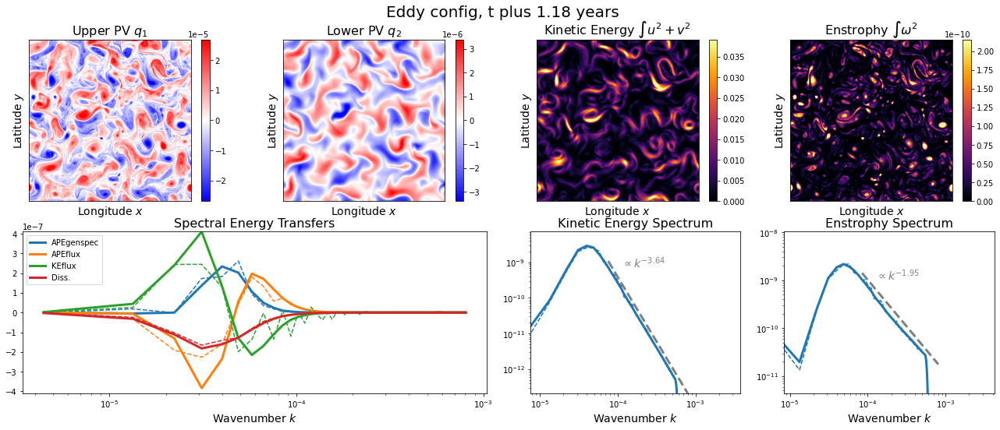

In [33]:
anim = plot_helpers.animate_simulation(m, label="Eddy config")
HTML(anim.to_html5_video())

INFO: Step: 90000, Time: 3.24e+08, KE: 1.90e-04, CFL: 0.162


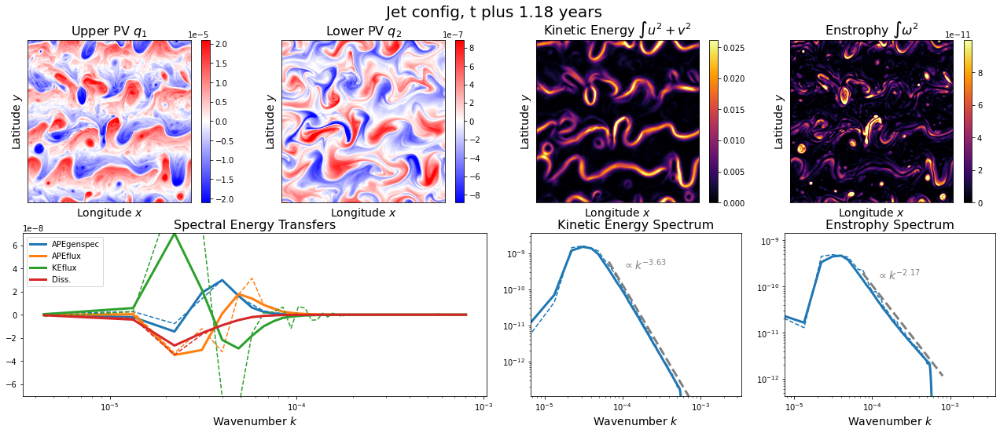

In [34]:
anim2 = plot_helpers.animate_simulation(m2, label="Jet config")
HTML(anim2.to_html5_video())

# Run low-resolution simulations in the same configurations

In [35]:
m3 = pyqg.QGModel(nx=64, dt=dt, tmax=5*year, tavestart=2.5*year, twrite=10000)
m3.run()

m4 = pyqg.QGModel(nx=64, dt=dt, tmax=10*year, tavestart=5*year, twrite=10000,
                 rek=7.000000e-08,
                 delta=0.10,
                 beta=1.0e-11)
m4.run()

INFO:  Logger initialized
INFO: Step: 10000, Time: 3.60e+07, KE: 1.06e-05, CFL: 0.006
INFO: Step: 20000, Time: 7.20e+07, KE: 4.22e-04, CFL: 0.051
INFO: Step: 30000, Time: 1.08e+08, KE: 4.43e-04, CFL: 0.048
INFO: Step: 40000, Time: 1.44e+08, KE: 4.58e-04, CFL: 0.040
INFO:  Logger initialized
INFO: Step: 10000, Time: 3.60e+07, KE: 1.87e-07, CFL: 0.006
INFO: Step: 20000, Time: 7.20e+07, KE: 7.91e-07, CFL: 0.006
INFO: Step: 30000, Time: 1.08e+08, KE: 1.12e-05, CFL: 0.007
INFO: Step: 40000, Time: 1.44e+08, KE: 2.17e-04, CFL: 0.033
INFO: Step: 50000, Time: 1.80e+08, KE: 1.47e-04, CFL: 0.035
INFO: Step: 60000, Time: 2.16e+08, KE: 1.78e-04, CFL: 0.037
INFO: Step: 70000, Time: 2.52e+08, KE: 1.38e-04, CFL: 0.035
INFO: Step: 80000, Time: 2.88e+08, KE: 1.54e-04, CFL: 0.036


INFO: Step: 70000, Time: 2.52e+08, KE: 5.19e-04, CFL: 0.048


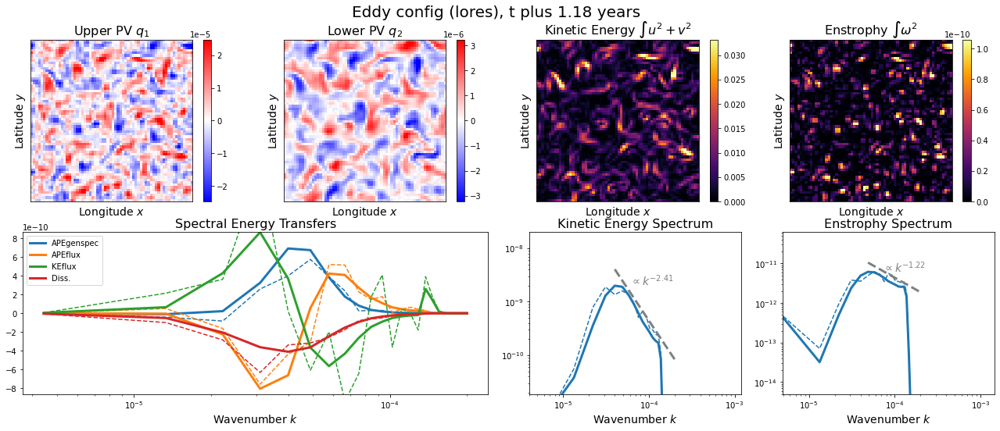

In [42]:
anim = plot_helpers.animate_simulation(m3, label="Eddy config (lores)", fit_opts=dict(offset=0, mult=3))
HTML(anim.to_html5_video())

INFO: Step: 110000, Time: 3.96e+08, KE: 1.54e-04, CFL: 0.036


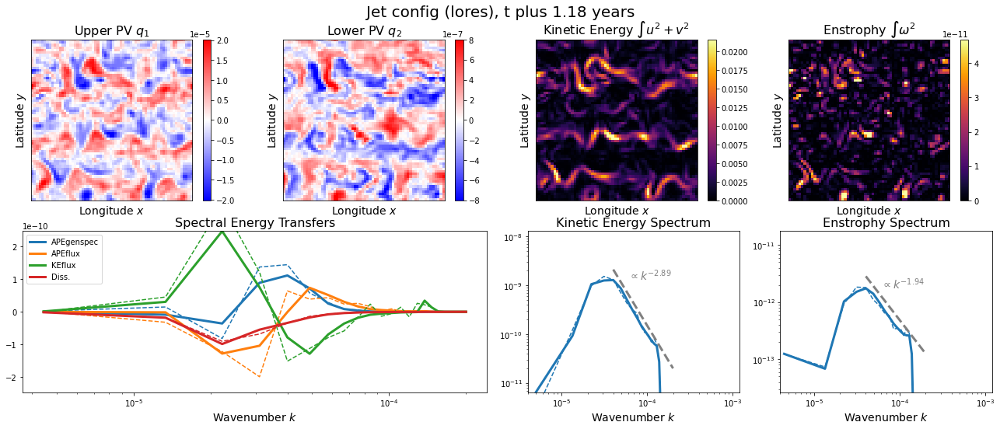

In [43]:
anim2 = plot_helpers.animate_simulation(m4, label="Jet config (lores)", fit_opts=dict(offset=0, mult=3))
HTML(anim2.to_html5_video())

We can see that these fail to resolve certain aspects of the high-resolution behavior, and also have different (less steep) rates of kinetic energy and enstrophy spectrum decay over inertial ranges of scale.

# Animate with tracer particles

## In high-res

INFO: Step: 60000, Time: 2.16e+08, KE: 6.42e-04, CFL: 0.237


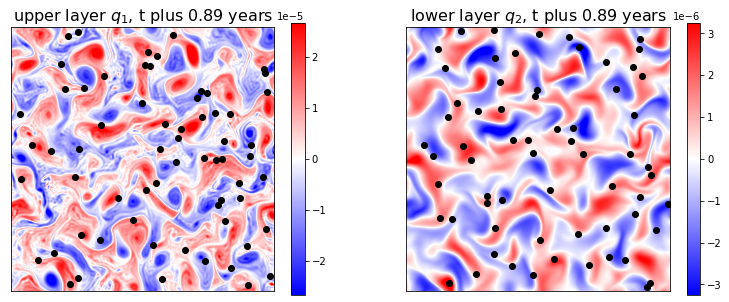

In [44]:
fig = plt.figure(figsize=(13,5))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

t0 = m.t
mp = plot_helpers.ModelWithParticles(m)
im1 = plot_helpers.AnimatedImage(ax1, lambda: m.q[0])
im2 = plot_helpers.AnimatedImage(ax2, lambda: m.q[1])
sc1 = plot_helpers.AnimatedScatterplot(ax1, lambda: mp.normalized_particle_coords[0], color='black')
sc2 = plot_helpers.AnimatedScatterplot(ax2, lambda: mp.normalized_particle_coords[1], color='black')

anims = [im1, im2, sc1, sc2]

def animate(i):
    for _ in range(75):
        mp._step_forward()
    res = []
    for anim in anims:
        res += anim.animate()
    ax1.set_title(f"upper layer $q_1$, t plus {(m.t-t0)/year:.2f} years", fontsize=16)
    ax2.set_title(f"lower layer $q_2$, t plus {(m.t-t0)/year:.2f} years", fontsize=16)
    return res    
   
anim = animation.FuncAnimation(fig, animate, frames=100, interval=50, blit=True)
HTML(anim.to_html5_video()) 

## In low-res

INFO: Step: 80000, Time: 2.88e+08, KE: 4.98e-04, CFL: 0.048


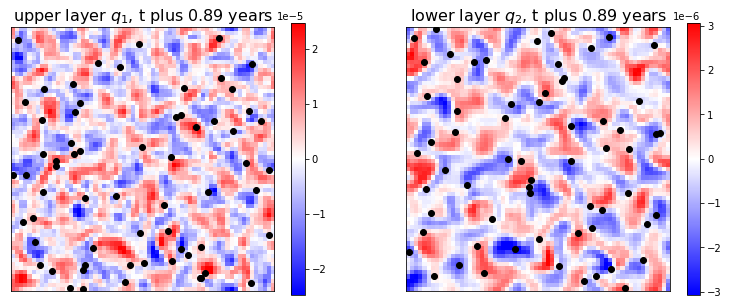

In [45]:
fig = plt.figure(figsize=(13,5))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

t0 = m3.t
mp = plot_helpers.ModelWithParticles(m3)
im1 = plot_helpers.AnimatedImage(ax1, lambda: m3.q[0])
im2 = plot_helpers.AnimatedImage(ax2, lambda: m3.q[1])
sc1 = plot_helpers.AnimatedScatterplot(ax1, lambda: mp.normalized_particle_coords[0], color='black')
sc2 = plot_helpers.AnimatedScatterplot(ax2, lambda: mp.normalized_particle_coords[1], color='black')

anims = [im1, im2, sc1, sc2]

def animate(i):
    for _ in range(75):
        mp._step_forward()
    res = []
    for anim in anims:
        res += anim.animate()
    ax1.set_title(f"upper layer $q_1$, t plus {(m3.t-t0)/year:.2f} years", fontsize=16)
    ax2.set_title(f"lower layer $q_2$, t plus {(m3.t-t0)/year:.2f} years", fontsize=16)
    return res    
    
anim = animation.FuncAnimation(fig, animate, frames=100, interval=50, blit=True)
HTML(anim.to_html5_video()) 